In [1]:
!pip install pymysql

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.0/45.0 kB 2.0 MB/s eta 0:00:00


In [2]:
import pymysql

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
import plotly.io as pio
import plotly.subplots as sp
import plotly.colors as pc
import plotly.express as px

In [ ]:
#Esercizio1: Sul database titanic, effettuiamo le seguenti analisi: • Quanti ponti c'erano sulla nave? • Visualizzare un grafico con il numero di passeggeri di ogni classe di imbarco • Fare la stessa cosa per la colonna alive • Qual era la distribuzione delle tariffe (fare)? • Riusciamo a vedere la distribuzione delle età dei passeggeri rispetto alla classe di imbarco? Proviamo con un boxplot e con un violinplot • Visualizziamo un boxplot rispetto alle colonne fare e survived; che cose ne deduciamo?

In [ ]:
#caricamento di un file da una cartella in locale

from google.colab import files
uploaded = files.upload()


Saving titanic.csv to titanic.csv


In [ ]:
df = pd.read_csv('titanic.csv')
df.sample(n=10)

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
800,801,0,2,"Ponesell, Mr. Martin",male,34.0,0,0,250647,13.0000,NaN,S
537,538,1,1,"LeRoy, Miss. Bertha",female,30.0,0,0,PC 17761,106.4250,NaN,C
12,13,0,3,"Saundercock, Mr. William Henry",male,20.0,0,0,A/5. 2151,8.0500,NaN,S
431,432,1,3,"Thorneycroft, Mrs. Percival (Florence Kate White)",female,NaN,1,0,376564,16.1000,NaN,S
338,339,1,3,"Dahl, Mr. Karl Edwart",male,45.0,0,0,7598,8.0500,NaN,S
799,800,0,3,"Van Impe, Mrs. Jean Baptiste (Rosalie Paula Go...",female,30.0,1,1,345773,24.1500,NaN,S
109,110,1,3,"Moran, Miss. Bertha",female,NaN,1,0,371110,24.1500,NaN,Q
374,375,0,3,"Palsson, Miss. Stina Viola",female,3.0,3,1,349909,21.0750,NaN,S
775,776,0,3,"Myhrman, Mr. Pehr Fabian Oliver Malkolm",male,18.0,0,0,347078,7.7500,NaN,S
810,811,0,3,"Alexander, Mr. William",male,26.0,0,0,3474,7.8875,NaN,S


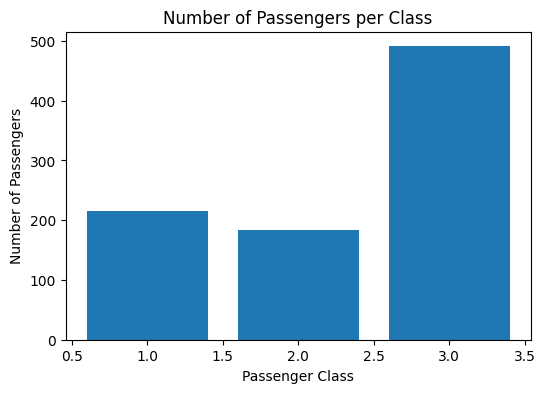

In [ ]:
# Count the number of passengers in each embarkation class
passenger_count_by_class = df['Pclass'].value_counts()

# Create a bar plot
plt.figure(figsize=(6, 4))
plt.bar(passenger_count_by_class.index, passenger_count_by_class.values)
plt.xlabel('Passenger Class')
plt.ylabel('Number of Passengers')
plt.title('Number of Passengers per Class')
plt.show()


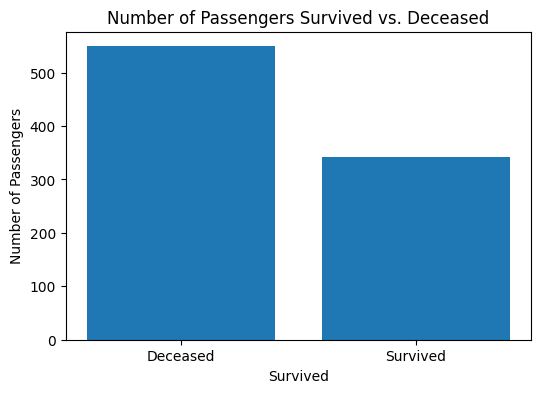

In [ ]:
# Count the number of passengers in each survival category
survived_count = df['Survived'].value_counts()

# Create a bar plot
plt.figure(figsize=(6, 4))
plt.bar(survived_count.index, survived_count.values)
plt.xlabel('Survived')
plt.ylabel('Number of Passengers')
plt.title('Number of Passengers Survived vs. Deceased')
plt.xticks(survived_count.index, ['Deceased', 'Survived'])  # Set x-axis labels
plt.show()


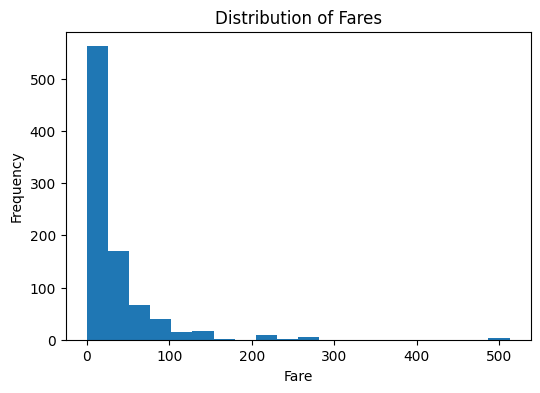

In [ ]:
# Create a histogram of the fare distribution
plt.figure(figsize=(6, 4))
plt.hist(df['Fare'], bins=20)
plt.xlabel('Fare')
plt.ylabel('Frequency')
plt.title('Distribution of Fares')
plt.show()


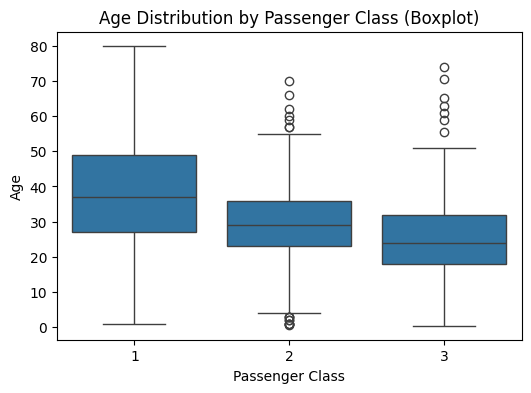

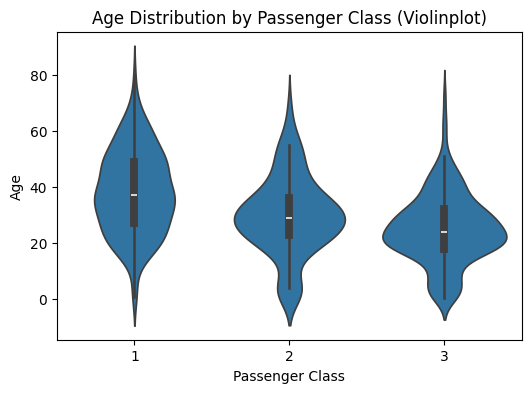

In [ ]:
#Riusciamo a vedere la distribuzione delle età dei passeggeri rispetto alla classe di imbarco? Proviamo con un boxplot e con un violinplot

# Boxplot
plt.figure(figsize=(6, 4))
sns.boxplot(x='Pclass', y='Age', data=df)
plt.xlabel('Passenger Class')
plt.ylabel('Age')
plt.title('Age Distribution by Passenger Class (Boxplot)')
plt.show()

# Violinplot
plt.figure(figsize=(6, 4))
sns.violinplot(x='Pclass', y='Age', data=df)
plt.xlabel('Passenger Class')
plt.ylabel('Age')
plt.title('Age Distribution by Passenger Class (Violinplot)')
plt.show()


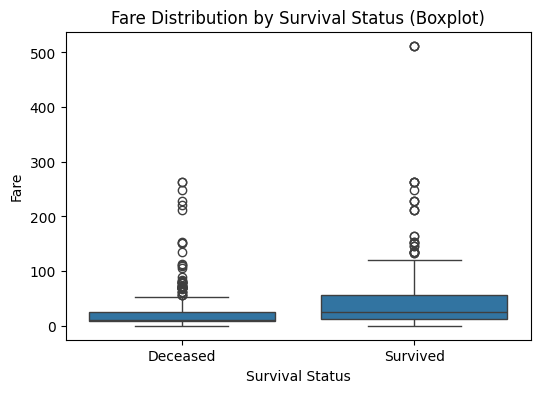

In [ ]:
# Create a copy of the DataFrame
df_copy = df.copy()

# Replace 0 with 'Deceased' and 1 with 'Survived' in the 'Survived' column
df_copy['Survived'] = df_copy['Survived'].replace({0: 'Deceased', 1: 'Survived'})

# Boxplot
plt.figure(figsize=(6, 4))
sns.boxplot(x='Survived', y='Fare', data=df_copy)
plt.xlabel('Survival Status')
plt.ylabel('Fare')
plt.title('Fare Distribution by Survival Status (Boxplot)')
plt.show()


In [ ]:
#Esercizio2: Scarichiamo il dataset stockdata.csv da https://github.com/plotly/datasets/blob/master/stockdata.csv e: • Visualizziamo l'andamento delle azioni della Apple ("AAPL") • Visualizziamo l'andamento di tutte le azioni del dataset • Visualizziamo l'andamento di Microsoft ("MSFT") e IBM ("IBM") negli anni 2012 e 2013 • Con un istogramma, troviamo il range di valori che le azioni di Microsoft hanno assunto più spesso

In [ ]:
#caricamento di un file da una cartella in locale

from google.colab import files
uploaded = files.upload()

Saving stockdata.csv to stockdata.csv


In [ ]:
stockdata_df = pd.read_csv('stockdata.csv')
stockdata_df.sample(n=10)

,MSFT,IBM,SBUX,AAPL,GSPC,Date
1212,23.965621,163.885505,19.977339,53.682751,1254.189941,2011-10-24
542,13.463888,79.031901,4.192041,11.815576,735.090027,2009-02-27
2100,45.459490,166.307557,48.895683,123.493969,2088.000000,2015-05-07
423,21.481837,99.622329,7.119597,20.892574,1267.790039,2008-09-08
171,23.045468,96.651977,12.443260,17.432969,1453.550049,2007-09-07
1209,23.912735,159.515224,19.216565,52.736815,1209.880005,2011-10-19
1472,27.044878,178.303411,24.635192,77.441232,1428.390015,2012-11-06
236,28.259807,91.823986,10.413671,25.693686,1515.959961,2007-12-10
1750,34.517824,161.717163,37.009745,75.860620,1775.319946,2013-12-13
1505,24.710247,176.632549,25.684914,69.428828,1426.660034,2012-12-24


In [ ]:
#Visualizziamo l'andamento delle azioni della Apple ("AAPL")

fig = px.line(stockdata_df, x='Date', y='AAPL', title='Apple Stock Price Over Time')
fig.show()


In [ ]:
#Visualizziamo l'andamento di tutte le azioni del dataset
fig = px.line(stockdata_df, x='Date', y=['MSFT', 'IBM', 'SBUX', 'AAPL', 'GSPC'], title='Stock Prices Over Time')
fig.show()


In [ ]:
#Visualizziamo l'andamento di Microsoft ("MSFT") e IBM ("IBM") negli anni 2012 e 2013

# Filter the DataFrame for the years 2012 and 2013
filtered_df = stockdata_df[(stockdata_df['Date'] >= '2012-01-01') & (stockdata_df['Date'] <= '2013-12-31')]

# Create a line plot for MSFT and IBM
fig = px.line(filtered_df, x='Date', y=['MSFT', 'IBM'], title='Microsoft and IBM Stock Prices (2012-2013)')
fig.show()


In [ ]:
#Con un istogramma, troviamo il range di valori che le azioni di Microsoft (MSFT) hanno assunto più spesso

# Create a histogram of MSFT stock prices
fig = px.histogram(stockdata_df, x='MSFT', nbins=50, title='Microsoft Stock Price Distribution')
fig.show()


In [ ]:
#Esercizio3: Scarichiamo il dataset metal_bands_2017.csv da https://www.kaggle.com/datasets/mrpantherson/metal-by-nation e: • Con Seaborn visualizziamo l'istogramma del numero dei fan delle varie band; cosa si vede? Cose ne deduciamo? • Delle band che suonano sia Progressive che Thrash, realizziamo un barplot che mostri quanti fan ci sono in totale rispetto al paese di origine (nota: in questo caso specifico, per accedere alla colonna "style" dovremo usare ["style"] e non .style perché quest'ultimo è un metodo) • Visualizziamo un istogramma delle date di formazione delle band (potremo dover convertire in qualche modo questo dato); si nota qualche trend?

In [ ]:
#caricamento di un file da una cartella in locale

from google.colab import files
uploaded = files.upload()

Saving metal_bands_2017.csv to metal_bands_2017.csv


In [ ]:
metal_bands_2017_df = pd.read_csv('metal_bands_2017.csv', encoding='latin-1') # try reading the file with 'latin-1' encoding
metal_bands_2017_df.sample(n=10)

,id,band_name,fans,formed,origin,split,style
3321,3321,WHOURKR,6,2005,France,2005,"Experimental death,Cybergrind"
4862,4862,Sphere Of Souls,1,2004,The Netherlands,-,Progressive
4471,4471,Winds Of Torment,2,2001,France,2001,Melodic death
1756,1756,One Man Army And The Undead Quartet,24,2004,Sweden,2012,"Death,Thrash"
1809,1809,Alabama Thunderpussy,22,1996,United States of America,1996,"Stoner,Heavy"
4192,4192,Dakesis,2,2008,United Kingdom,-,Progressive power
3547,3547,AfterBlood,4,2011,Greece,2011,"Death,Thrash"
279,279,The Black Dahlia Murder,326,2001,United States of America,2001,"Melodic death,Metalcore"
3385,3385,Dystera,5,2006,Switzerland,2006,Symphonic power
3903,3903,Goathemy,3,1995,Finland,1995,Melodic black


In [ ]:
#Visualizziamo l'istogramma del numero dei fan delle varie band; cosa si vede? Cose ne deduciamo?

fig = px.histogram(metal_bands_2017_df, x='fans', nbins=200, title='Distribution of Fans per Band')
fig.show()
#la maggiorparte delle band metal ha un numero di fan compreso da 0 a circa 50

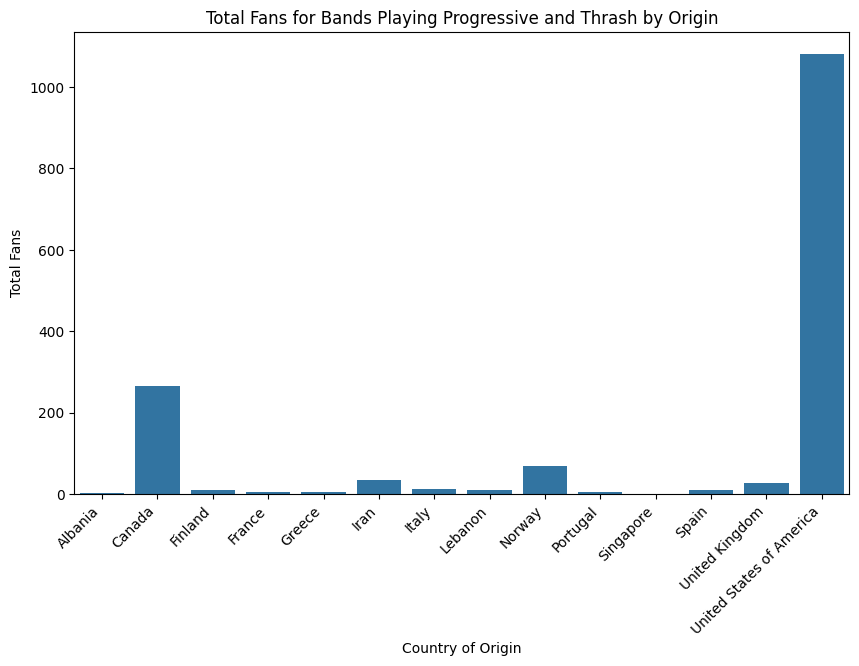

In [ ]:
#Delle band che suonano sia Progressive che Thrash (colonna style), realizziamo un barplot che mostri quanti fan ci sono in totale rispetto al paese di origine (colonna origin) (nota: in questo caso specifico, per accedere alla colonna "style" dovremo usare ["style"] e non .style perché quest'ultimo è un metodo)

filtered_df = metal_bands_2017_df[
    metal_bands_2017_df['style'].str.contains('Progressive') &
    metal_bands_2017_df['style'].str.contains('Thrash')
]

fans_by_origin = filtered_df.groupby('origin')['fans'].sum()

plt.figure(figsize=(10, 6))
sns.barplot(x=fans_by_origin.index, y=fans_by_origin.values)
plt.xlabel('Country of Origin')
plt.ylabel('Total Fans')
plt.title('Total Fans for Bands Playing Progressive and Thrash by Origin')
plt.xticks(rotation=45, ha='right')
plt.show()


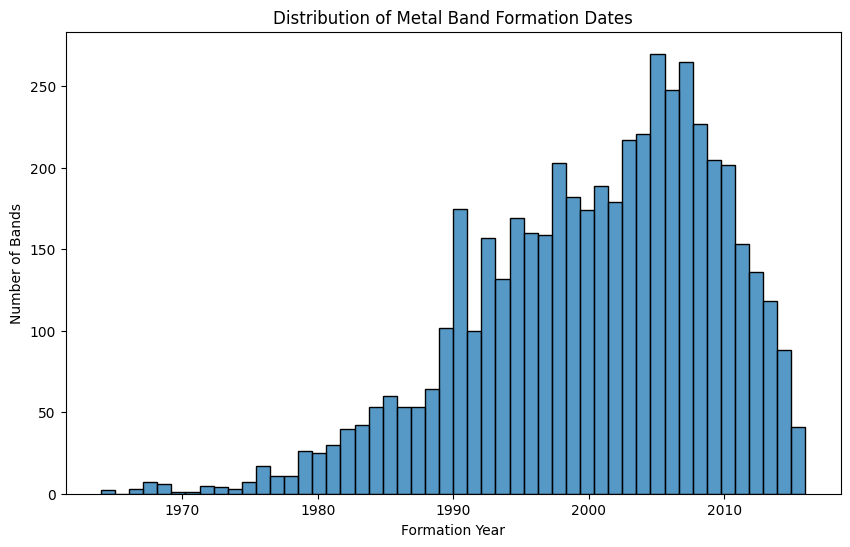

In [ ]:
#Visualizziamo un istogramma delle date di formazione delle band (potremo dover convertire in qualche modo questo dato); si nota qualche trend?
metal_bands_2017_df['formed'] = metal_bands_2017_df['formed'].replace(' ', 'none')
matal_bands_2017_withoutna_df = metal_bands_2017_df.dropna(subset=['formed'])
matal_bands_2017_withoutna_df['formed'] = pd.to_datetime(matal_bands_2017_withoutna_df['formed'], errors='coerce')

plt.figure(figsize=(10, 6))
sns.histplot(matal_bands_2017_withoutna_df['formed'], bins=50)
plt.xlabel('Formation Year')
plt.ylabel('Number of Bands')
plt.title('Distribution of Metal Band Formation Dates')
plt.show()

#crescita esponenziale del numero di band metal a partire dal 1970 fino al 2006 e poi una diminuzione repentina. Il picco si è raggiunto dal 2004 al 2006.

In [ ]:
#Esercizio4: Scarichiamo il dataset elections.csv da https://github.com/plotly/datasets/blob/master/election.csv: • Con un grafico a barre confrontiamo i voti totali presi dai tre candidati (come somma di tutti i distretti) • Con un grafico a barre confrontiamo il numero di votanti per ogni distretto • Visualizzare un grafico a barre comparativo dove si confrontano i voti presi nei primi 4 distretti per ogni candidato

In [ ]:
#caricamento di un file da una cartella in locale

from google.colab import files
uploaded = files.upload()

Saving election.csv to election.csv


In [ ]:
election_df = pd.read_csv('election.csv')
election_df.sample(n=10)

,district,Coderre,Bergeron,Joly,total,winner,result,district_id
10,13-Ahuntsic,2979,3430,2873,9282,Bergeron,plurality,13
36,33-Snowdon,1548,1503,1636,4687,Joly,plurality,33
12,132-Étienne-Desmarteau,2331,5748,2788,10867,Bergeron,majority,132
5,113-Jeanne-Mance,1455,3599,2316,7370,Bergeron,plurality,113
41,43-Fort-Rolland,1325,1205,1908,4438,Joly,plurality,43
48,71-Tétreaultville,3694,2589,3454,9737,Coderre,plurality,71
30,194-Parc-Extension,2420,1793,1402,5615,Coderre,plurality,194
13,133-Vieux-Rosemont,2670,4962,3234,10866,Bergeron,plurality,133
31,21-Ouest,2184,691,1076,3951,Coderre,majority,21
56,93-Robert-Bourassa,446,465,419,1330,Bergeron,plurality,93


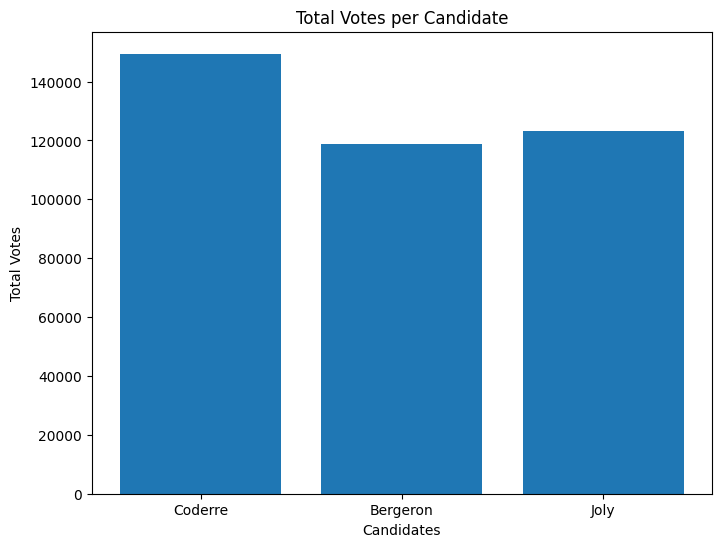

In [ ]:
#Con un grafico a barre confrontiamo i voti totali presi dai tre candidati (come somma di tutti i distretti)

total_votes_coderre = election_df['Coderre'].sum()
total_votes_bergeron = election_df['Bergeron'].sum()
total_votes_joly = election_df['Joly'].sum()

candidates = ['Coderre', 'Bergeron', 'Joly']
total_votes = [total_votes_coderre, total_votes_bergeron, total_votes_joly]

plt.figure(figsize=(8, 6))
plt.bar(candidates, total_votes)
plt.xlabel('Candidates')
plt.ylabel('Total Votes')
plt.title('Total Votes per Candidate')
plt.show()


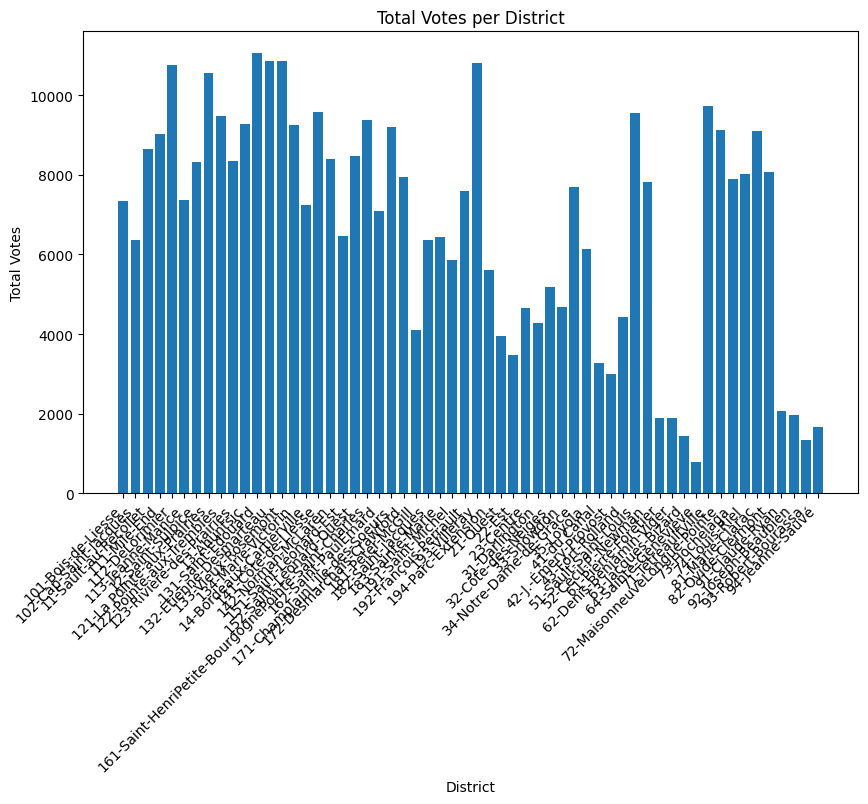

In [ ]:
#Con un grafico a barre confrontiamo il numero di votanti per ogni distretto

# Calculate the total votes for each district
total_votes_per_district = election_df.groupby('district')['total'].sum()

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.bar(total_votes_per_district.index, total_votes_per_district.values)
plt.xlabel('District')
plt.ylabel('Total Votes')
plt.title('Total Votes per District')
plt.xticks(rotation=45, ha='right')
plt.show()


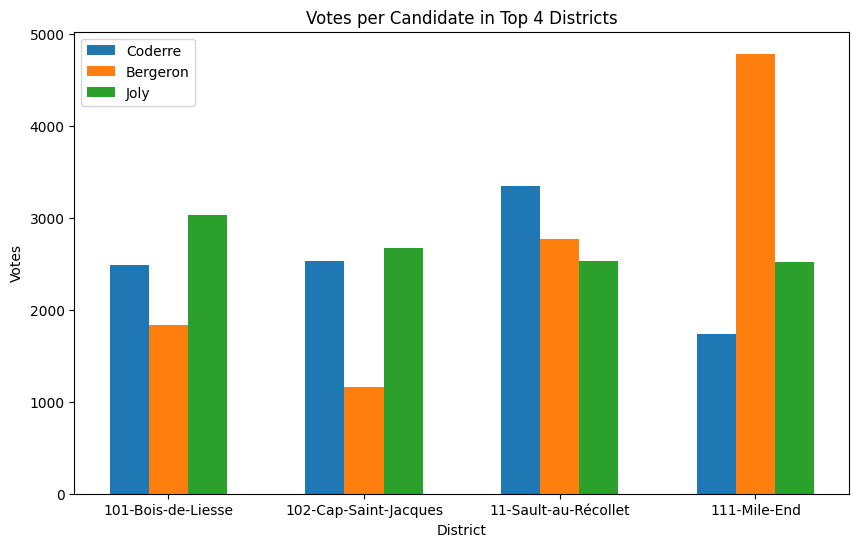

In [ ]:
#Visualizzare un grafico a barre comparativo dove si confrontano i voti presi nei primi 4 distretti per ogni candidato

# Select the first 4 districts
top_4_districts = election_df.iloc[:4]

# Create a bar plot for the top 4 districts
fig, ax = plt.subplots(figsize=(10, 6))
width = 0.2

x = np.arange(len(top_4_districts['district']))

ax.bar(x, top_4_districts['Coderre'], width, label='Coderre')
ax.bar(x + width, top_4_districts['Bergeron'], width, label='Bergeron')
ax.bar(x + (width * 2), top_4_districts['Joly'], width, label='Joly')

ax.set_xticks(x + width)
ax.set_xticklabels(top_4_districts['district'])
ax.legend()
plt.xlabel('District')
plt.ylabel('Votes')
plt.title('Votes per Candidate in Top 4 Districts')
plt.show()


In [ ]:
#Esercizio5: Scarichiamo i file party_in_nyc.csv dal dataset https://www.kaggle.com/datasets/somesnm/partynyc relativo a quante volte è stata chiamata la polizia per delle feste eccessivamente rumorose: • Realizziamo un grafico che mostra quante chiamate ci sono state per ogni città per tutti i tipi di locale • Qual è il rettangolo di latitudine e longitudine considerato dal dataset? • Quante segnalazioni sono state fatte per case private? • Con Seaborn visualizziamo il conteggio delle segnalazioni avvenute in ogni quartiere; che succede se aggiungiamo il parametro hue="Location Type"?

In [4]:
#caricamento di un file da una cartella in locale

from google.colab import files
uploaded = files.upload()

Saving party_in_nyc.csv to party_in_nyc.csv


In [5]:
party_in_nyc_df = pd.read_csv('party_in_nyc.csv')
party_in_nyc_df.sample(n=10)

,Created Date,Closed Date,Location Type,Incident Zip,City,Borough,Latitude,Longitude
177465,2016-10-01 21:01:05,2016-10-01 22:14:58,Street/Sidewalk,11249.0,BROOKLYN,BROOKLYN,40.716878,-73.960878
109061,2016-07-03 02:16:44,2016-07-03 04:21:52,Residential Building/House,11238.0,BROOKLYN,BROOKLYN,40.683431,-73.962820
121510,2016-07-17 02:42:38,2016-07-17 19:25:00,Residential Building/House,10467.0,BRONX,BRONX,40.865751,-73.869146
82419,2016-06-04 02:23:30,2016-06-04 04:30:45,Residential Building/House,11214.0,BROOKLYN,BROOKLYN,40.599441,-74.003597
154774,2016-09-03 23:47:18,2016-09-04 03:14:05,Residential Building/House,11385.0,RIDGEWOOD,QUEENS,40.707180,-73.896920
101695,2016-06-25 20:16:54,2016-06-25 20:43:34,Store/Commercial,10016.0,NEW YORK,MANHATTAN,40.749345,-73.976938
19409,2016-02-20 00:34:58,2016-02-20 00:54:19,Residential Building/House,10028.0,NEW YORK,MANHATTAN,40.776823,-73.951379
87868,2016-06-11 01:39:32,2016-06-11 05:39:02,Store/Commercial,11216.0,BROOKLYN,BROOKLYN,40.681870,-73.949372
105407,2016-06-29 00:14:11,2016-06-29 08:06:35,Residential Building/House,11207.0,BROOKLYN,BROOKLYN,40.684836,-73.911388
16700,2016-02-12 23:38:11,2016-02-13 00:17:45,Residential Building/House,10009.0,NEW YORK,MANHATTAN,40.722516,-73.980735


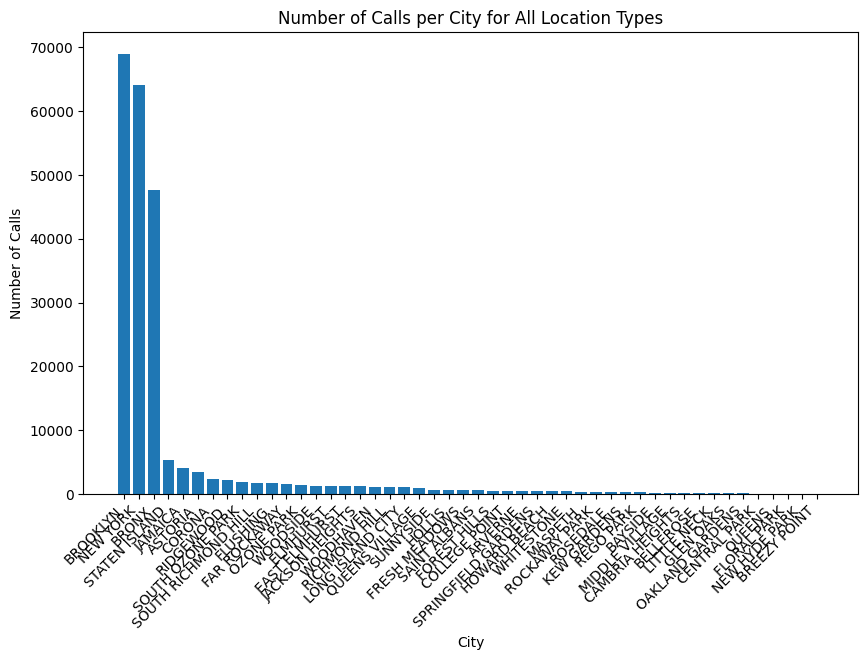

In [6]:
#Realizziamo un grafico che mostra quante chiamate ci sono state per ogni città per tutti i tipi di locale

calls_per_city = party_in_nyc_df['City'].value_counts()

plt.figure(figsize=(10, 6))
plt.bar(calls_per_city.index, calls_per_city.values)
plt.xlabel('City')
plt.ylabel('Number of Calls')
plt.title('Number of Calls per City for All Location Types')
plt.xticks(rotation=45, ha='right')
plt.show()


Minimum Latitude: 40.498819681472185
Maximum Latitude: 40.91217840308113
Minimum Longitude: -74.25127710072611
Maximum Longitude: -73.70230256557906


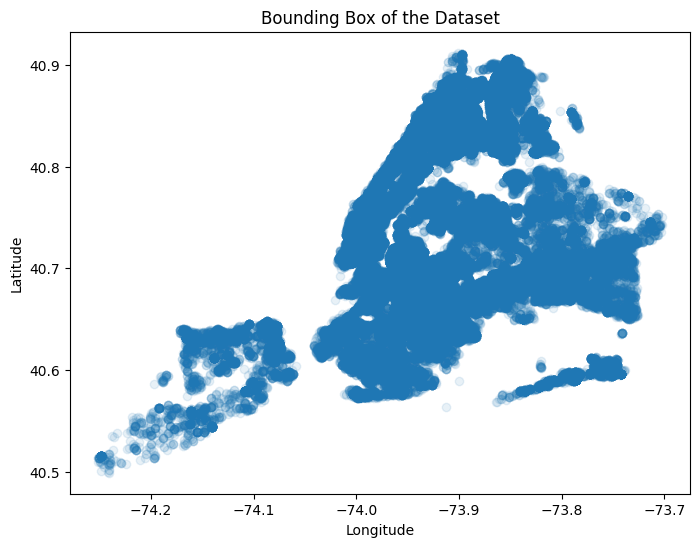

In [9]:
#Qual è il rettangolo di latitudine e longitudine considerato dal dataset?

min_latitude = party_in_nyc_df['Latitude'].min()
max_latitude = party_in_nyc_df['Latitude'].max()
min_longitude = party_in_nyc_df['Longitude'].min()
max_longitude = party_in_nyc_df['Longitude'].max()

print(f"Minimum Latitude: {min_latitude}")
print(f"Maximum Latitude: {max_latitude}")
print(f"Minimum Longitude: {min_longitude}")
print(f"Maximum Longitude: {max_longitude}")

plt.figure(figsize=(8, 6))
plt.scatter(party_in_nyc_df['Longitude'], party_in_nyc_df['Latitude'], alpha=0.1)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Bounding Box of the Dataset')
plt.show()

import plotly.express as px

fig = px.scatter_mapbox(party_in_nyc_df, lat="Latitude", lon="Longitude", hover_name="City", color="Location Type", zoom=10, height=600)
fig.update_layout(mapbox_style="open-street-map")
fig.show()


In [20]:
#Quante segnalazioni sono state fatte per case private (Residential Building/House)?
residential_calls = party_in_nyc_df[party_in_nyc_df['Location Type'] == 'Residential Building/House']['Location Type'].count()
print(f"Number of calls for private houses: {residential_calls}")


Number of calls for private houses: 146040


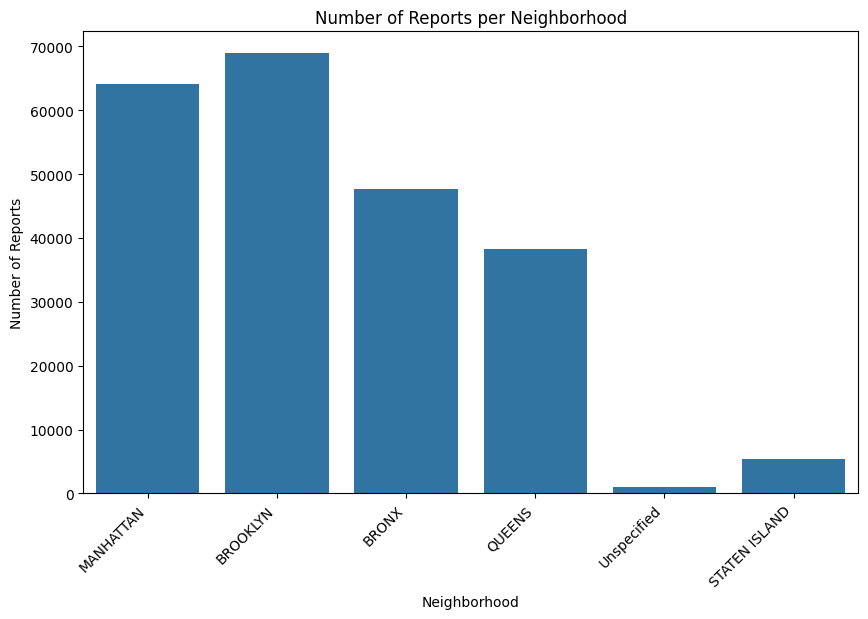

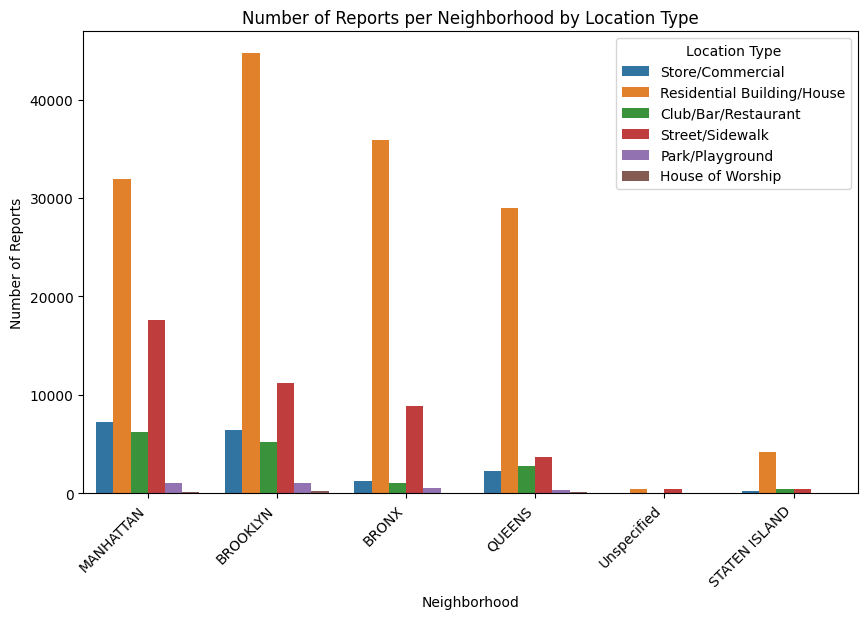

In [23]:
#Con Seaborn visualizziamo il conteggio delle segnalazioni avvenute in ogni quartiere; che succede se aggiungiamo il parametro hue="Location Type"?

neighborhood_counts = party_in_nyc_df['Borough'].value_counts()
print(neighborhood_counts)

# Create a bar plot using Seaborn
plt.figure(figsize=(10, 6))
sns.countplot(x='Borough', data=party_in_nyc_df)
plt.xlabel('Neighborhood')
plt.ylabel('Number of Reports')
plt.title('Number of Reports per Neighborhood')
plt.xticks(rotation=45, ha='right')
plt.show()

# Create a countplot with hue="Location Type"
plt.figure(figsize=(10, 6))
sns.countplot(x='Borough', hue='Location Type', data=party_in_nyc_df)
plt.xlabel('Neighborhood')
plt.ylabel('Number of Reports')
plt.title('Number of Reports per Neighborhood by Location Type')
plt.xticks(rotation=45, ha='right')
plt.show()
